In [51]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

# %load_ext nb_black
use_cuda = True

sc.set_figure_params(dpi=200)

In [22]:
import sys
sys.path.append('/home/angela/src/scVI_TSP/')
sys.path.append('/home/angela/sapiens/tabula-sapiens/')
# from utils.annotations_utils import *
from utils.colorDict import *
from utils.general_utils import *
from utils.plotting_utils import *

In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [9]:
data_path = "/mnt/ibm_lg/angela/sapiens/data/"

In [11]:
adata = read_h5ad(data_path + "Pilot1_Pilot2.decontX.h5ad")

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/angela/.local/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11004. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


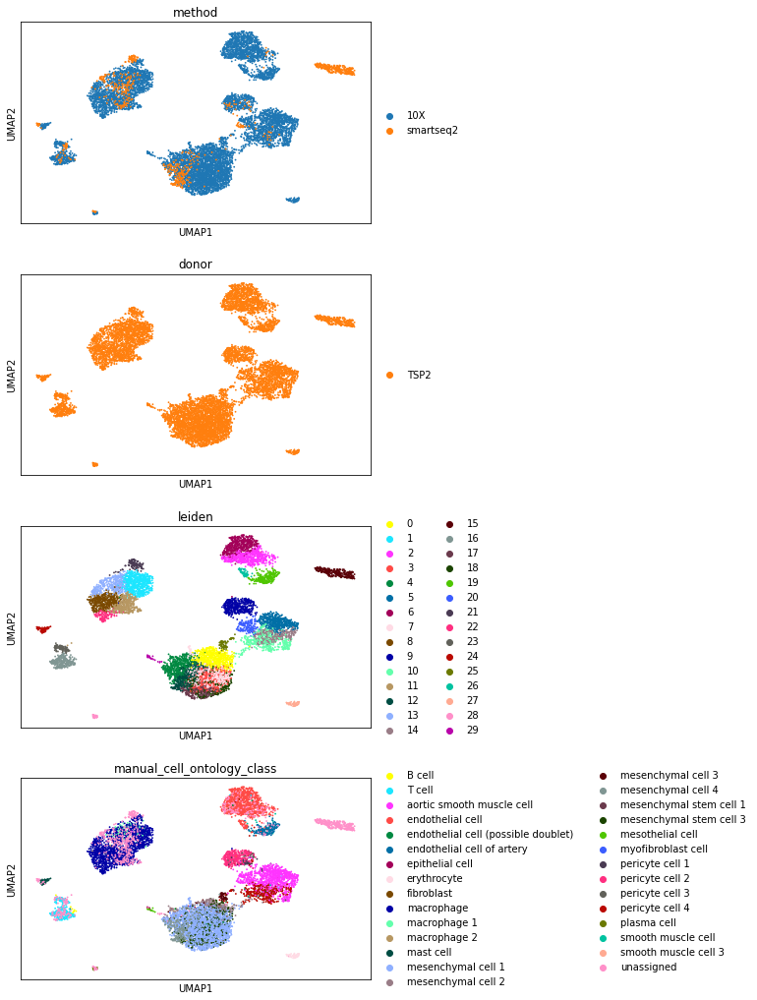

In [12]:
organ = "Vasculature"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [30]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

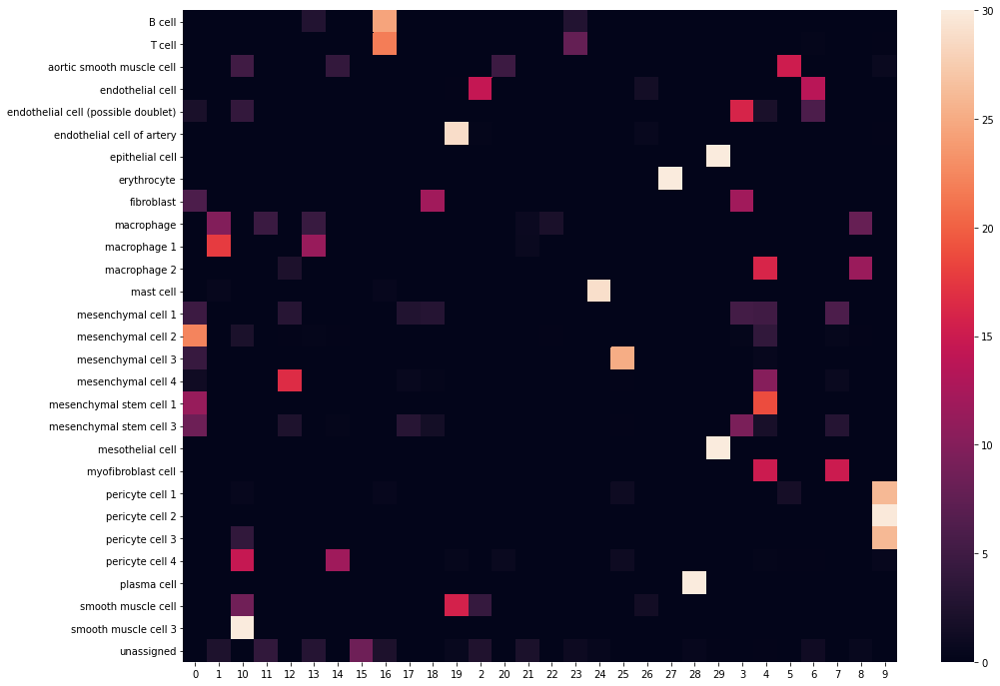

In [14]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.mean(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [15]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [113]:
cluster_composition["9"]

['T cell: 0.00',
 'aortic smooth muscle cell: 0.06',
 'endothelial cell: 0.00',
 'endothelial cell of artery: 0.00',
 'pericyte cell 1: 0.11',
 'pericyte cell 2: 0.75',
 'pericyte cell 3: 0.06',
 'pericyte cell 4: 0.02',
 'unassigned: 0.00']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [17]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [153]:
cluster_purity

,0,1
0,0.520995,mesenchymal cell 1
1,0.907965,macrophage
10,0.478372,pericyte cell 4
11,1,macrophage
12,0.59726,mesenchymal cell 1
13,0.87218,macrophage
14,0.527586,pericyte cell 4
15,NaN,B cell
16,0.94359,T cell
17,0.786008,mesenchymal cell 1


In [18]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

/home/angela/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in long_scalars
  """


In [19]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


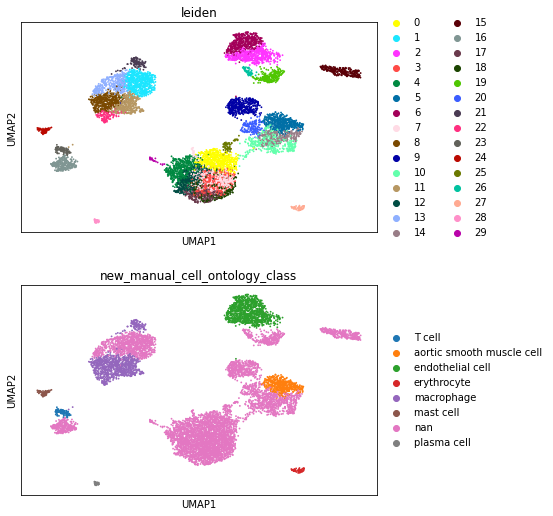

In [20]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [31]:
organ_adata

AnnData object with n_obs × n_vars = 9096 × 58870
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method'

In [41]:
organ_adata.obs.groupby(['leiden']).agg({'new_manual_cell_ontology_class':set,'Propagated.Annotation':set})

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{nan},"{mesenchymal cell 1, fibroblast, mesenchymal c..."
1,{nan},"{mast cell, endothelial cell, macrophage 1, ma..."
2,{endothelial cell},"{T cell, B cell, endothelial cell, endothelial..."
3,{nan},"{macrophage, endothelial cell, fibroblast, mes..."
4,{nan},"{cell, macrophage 2, macrophage, mesenchymal c..."
5,{aortic smooth muscle cell},"{pericyte cell 4, aortic smooth muscle cell, p..."
6,{endothelial cell},"{T cell, endothelial cell, fibroblast}"
7,{nan},"{mesenchymal cell 1, fibroblast, mesenchymal c..."
8,{macrophage},"{endothelial cell, macrophage 2, macrophage}"


/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



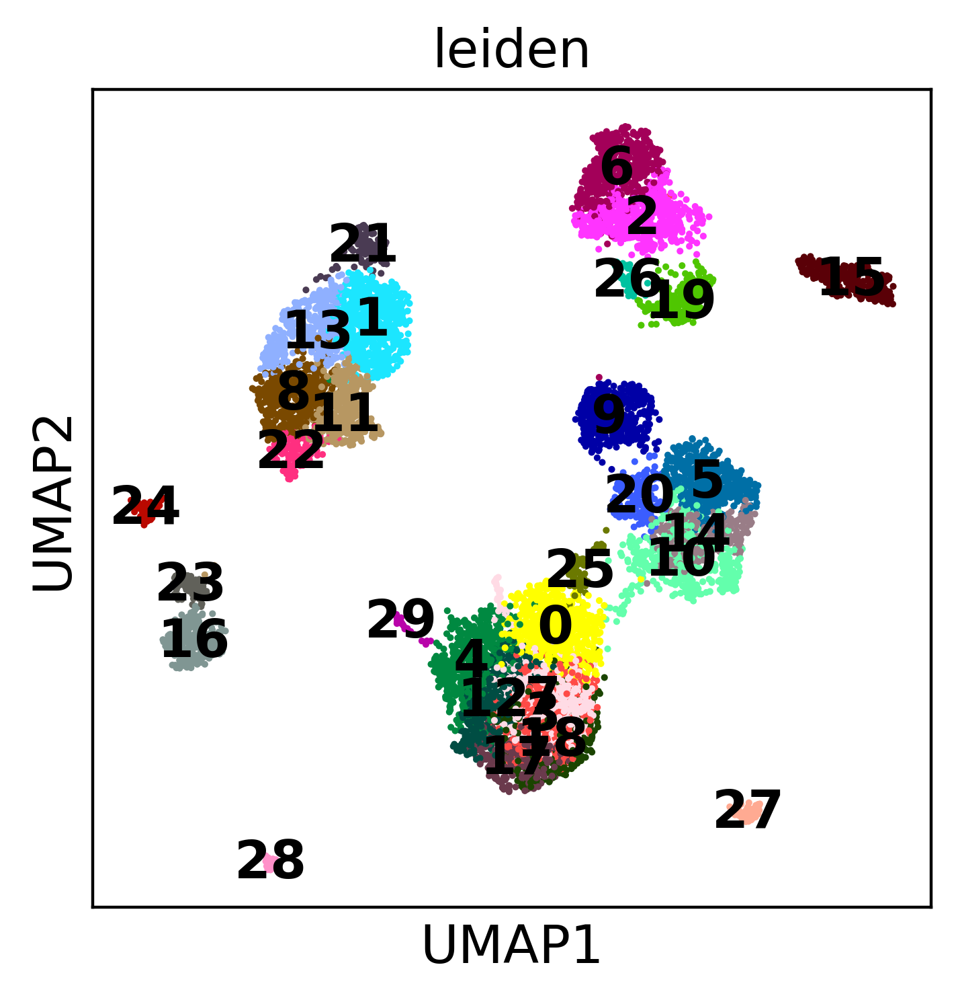

In [52]:
sc.pl.umap(organ_adata,color='leiden',legend_loc='on data')

In [46]:
sc.tl.rank_genes_groups(organ_adata,'leiden',method='wilcoxon')

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



In [78]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,SERPINF1,LYVE1,PLVAP,FBN1,C3,TPM2,ACKR1,PLA2G2A,MSR1,NOTCH3,...,TPM2,C1QA,CTSZ,KLRD1,TPSB2,APOD,CLDN5,HBA2,DERL3,MUC16
1,COL6A3,MRC1,VWF,SCARA5,LAMA2,PLN,PLVAP,CFD,HLA-DRA,MYL9,...,PPP1R14A,C1QB,CTSD,CXCR4,KIT,SCN7A,SLC9A3R2,HBA1,MZB1,ITLN1
2,PRRX1,VSIG4,PECAM1,MFAP5,CCDC80,MYL9,RAMP3,MGST1,SLCO2B1,ACTA2,...,TAGLN,C1QC,FABP5,NKG7,TPSAB1,CDH19,ICAM2,HBB,SPAG4,HP
3,SPOCK1,S100A9,RAMP3,FSTL1,FBLN1,RGS5,CAVIN2,GPX3,LAPTM5,TINAGL1,...,MYL9,FCER1G,CAPG,CCL5,CPA3,ANGPTL7,SOX18,SLC25A37,FCRL5,MSLN
4,C1S,RNASE1,ACKR1,UAP1,ABCA8,RAMP1,ADGRL4,DCN,CCL3L1,TAGLN,...,IGFBP2,FTL,CSTB,CTSW,CD69,NDRG2,TM4SF1,SLC25A39,SEC11C,BICDL1
5,SFRP2,C1QA,ADGRL4,ADAMTS5,SFRP2,PPP1R14A,GIMAP7,SLPI,FCGR2A,TPM2,...,ACTA2,RNASE1,SPI1,CD69,RHEX,NGFR,CAV1,ALAS2,SSR4,KRT19
6,C1R,MS4A6A,SOX18,TNXB,DCN,MYH11,SOCS3,FBLN1,FCGR3A,MYLK,...,DSTN,TYROBP,ACP5,XCL2,IL1RL1,PTGDS,SOX17,SNCA,CYBA,RARRES1
7,APOD,C1QC,GIMAP7,FBLN2,C1R,ACTA2,NPDC1,MFAP5,CCL3,NR2F2,...,RGS5,CD163,APOC1,KLRC1,RGS2,MEOX2,PODXL,TRIM58,TNFRSF17,KRT18
8,PCOLCE,F13A1,EGFL7,CCDC80,FBN1,DSTN,VWF,GAS1,HLA-DPA1,AP002956.1,...,C12orf75,CD74,ITGAX,HCST,HPGDS,GPC3,CLEC14A,DCAF12,ISG20,PRG4
9,PODN,C1orf162,CLEC14A,CD248,ABI3BP,ITGA8,SOX18,IGFBP6,TYROBP,CSRP2,...,MYH11,F13A1,APOE,CCL4,ALOX5AP,THBS4,IFI27,GYPC,FKBP11,UPK3B


In [160]:
# organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
g = list(organ_cluster_genes["11"].head(10))
g = ",".join(g)
print(g)

TNFAIP3,GPR183,LYZ,CD83,CXCL8,CCL3,SRGN,LAPTM5,NLRP3,IL1B


In [49]:
organ_adata

AnnData object with n_obs × n_vars = 9096 × 58870
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method'

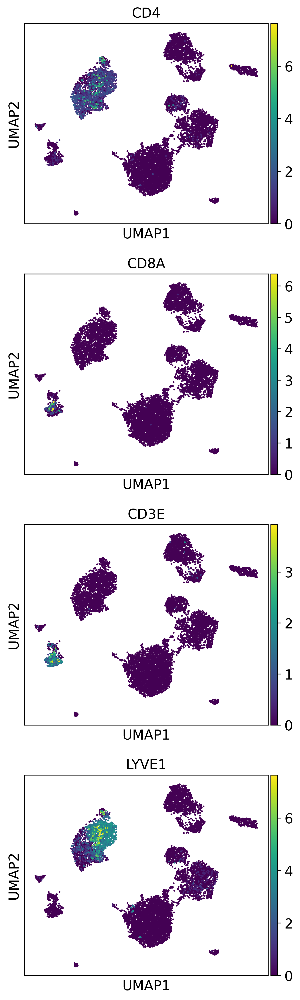

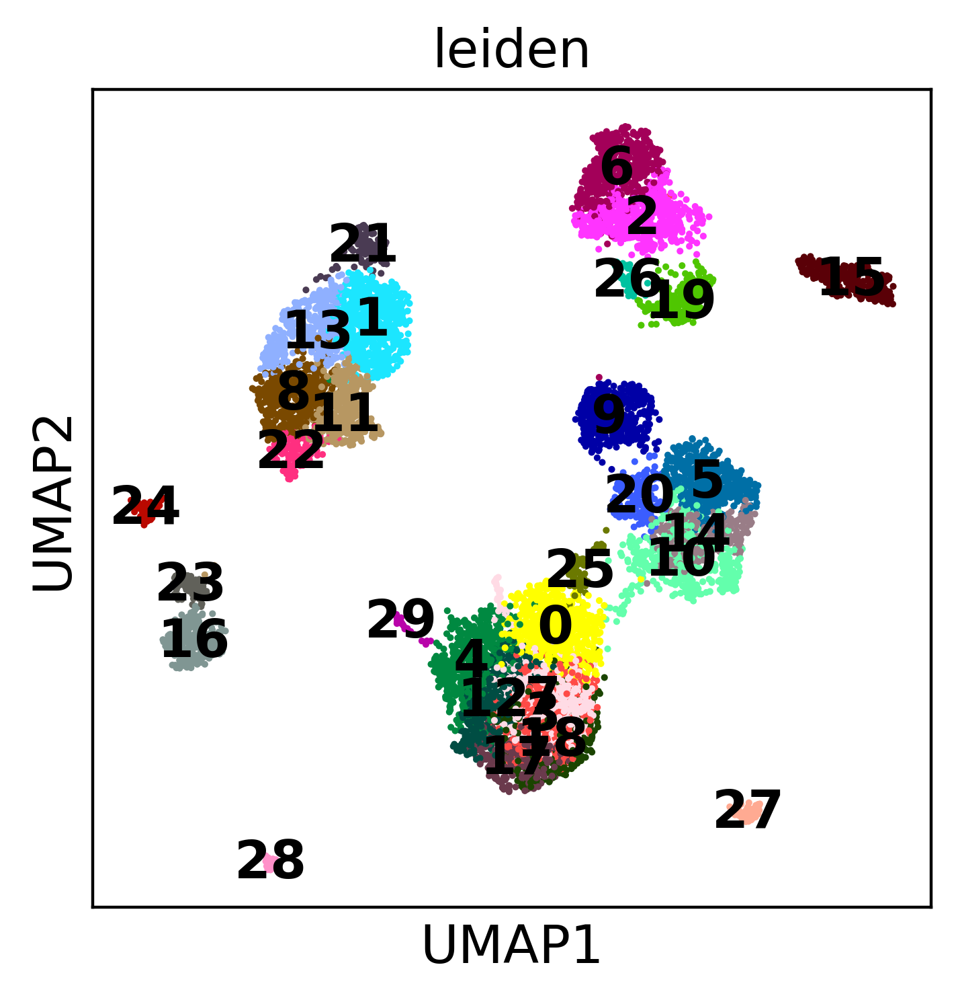

In [157]:
# sc.pl.umap(organ_adata,color=['WT1','CALB2','LRRN4','UPK3B'],ncols=1)#'HBME', mesothelial
# sc.pl.umap(organ_adata,color=[ 'CALB2', 'DIP2C', 'EPB41L1', 'KIAA1549', 'L1CAM', 'NTM'],ncols=1)
sc.pl.umap(organ_adata,color=[ 'CD4','CD8A','CD3E','LYVE1'],ncols=1) # t cells
# sc.pl.umap(organ_adata,color=[ 'BDCA','CD8A','CD3E'],ncols=1) # BDCA
# sc.pl.umap(organ_adata,color=[ 'NR2F2','SOX17','GJA5','NOG','ITGA6'],ncols=1) # 
# sc.pl.umap(organ_adata,color=[ 'CD44','CSPG4','PDGFRB', 'ACTA2','MYL9','MYH11'],ncols=2)
sc.pl.umap(organ_adata,color='leiden',legend_loc='on data')
# sc.pl.umap(organ_adata,color='anatomical_position')


In [159]:
set(organ_adata.obs[organ_adata.obs['leiden']=='1']['manual_annotation'])

{'aortic smooth muscle cell',
 'macrophage',
 'macrophage 1',
 'mast cell',
 'unassigned'}

In [143]:
leiden_cell_type = {
    '0' : "fibroblast",
    '1' : "aortic macrophage (LYVE1+)",
    '2' : "vein endothelial cell",
    '3' : "fibroblast",
    '4' : "advential fibroblast",
    '5' : "aortic smooth muscle cell",
    '6' : "vein endothelial cell",
    '7' : "fibroblast",
    '8' : "macrophage",
    '9' : "aortic smooth muscle cell",
    '10' : "aortic smooth muscle cell",
    '11' : "aortic macrophage (LYVE1+)",
    '12' : "fibroblast",
    '13' : "macrophage",
    '14' : "aortic smooth muscle cell",
    '15' : "diseased cells, markers for plaque atherosclerosis and macrophages",
    '16' : "CD8 T cells",
    '17' : "fibroblast",
    '18' : "fibroblast",
    '19' : "arterial endothelial cells",
    '20' : "aortic smooth muscle cell",
    '21' : "macrophage",
    '22' : "macrophage",
    '23' : "T cell",
    '24' : "mast cell",
    '25' : "fibroblast",
    '26' : "arterial endothelial cells",
    '27' : "erythrocyte",
    '28' : "plasma cell",
    '29' : "mesothelial_cells", #'WT1','CALB2','LRRN4','UPK3B' 
}

In [127]:
adata.var_names[adata.var_names.str.startswith("PDG")]

Index(['PDGFRA', 'PDGFC', 'PDGFRB', 'PDGFA', 'PDGFRL', 'PDGFD', 'PDGFB'], dtype='object')

# Sankey Diagram between cluster and cell types

In [23]:
from utils.colorDict import donor_colors, method_colors, compartment_colors, tissue_colors

In [24]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [26]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
# plotly.offline.plot(
#     fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
# )  # , output_type='div')

# visualize compartment markers

In [27]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [28]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/home/angela/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



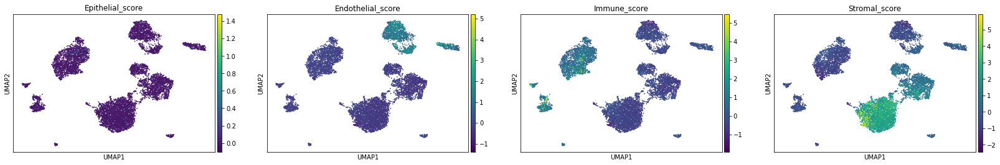

In [29]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [20]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [21]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [22]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [23]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
SERPINF1,34.297207,4.121323,5.084276e-253
COL6A3,32.768597,3.396478,4.857053e-231
PRRX1,32.482800,3.099557,3.660727e-227
SPOCK1,32.251904,3.284850,4.868929e-224
C1S,32.030838,3.430645,4.778911e-221
SFRP2,31.969236,4.009863,2.864657e-220
C1R,31.948431,3.519609,4.777331e-220
APOD,31.764252,4.698852,1.485331e-217
PCOLCE,31.644648,2.897825,5.877009e-216
PODN,31.487259,3.257517,7.641371e-214


1


,wilcoxon_score,log fold change,adjusted pvalue
LYVE1,39.831425,6.511505,0.000000e+00
MRC1,37.743416,5.166672,0.000000e+00
VSIG4,37.603676,5.298666,3.673441e-305
S100A9,37.398365,5.596438,6.113910e-302
RNASE1,37.300045,5.634115,1.928854e-300
C1QA,37.092056,6.009985,3.701817e-297
MS4A6A,36.904797,4.869657,3.255515e-294
C1QC,36.499371,5.217374,8.349972e-288
F13A1,36.281643,5.393770,2.061238e-284
C1orf162,36.218479,4.425202,1.834626e-283


2


,wilcoxon_score,log fold change,adjusted pvalue
PLVAP,33.037254,4.696499,1.396000e-234
VWF,32.794399,4.802966,1.388639e-231
PECAM1,31.455311,3.767669,5.226650e-213
RAMP3,31.139091,4.328655,8.390590e-209
ACKR1,30.942301,5.191649,3.164311e-206
ADGRL4,30.527870,4.192523,9.354630e-201
SOX18,30.305126,4.186808,7.220698e-198
GIMAP7,30.042740,3.640287,1.776699e-194
EGFL7,29.817999,3.407764,1.344037e-191
CLEC14A,29.599493,3.749890,8.118159e-189


3


,wilcoxon_score,log fold change,adjusted pvalue
FBN1,32.390469,4.029448,2.200910e-225
SCARA5,32.045319,4.062889,7.508970e-221
MFAP5,31.782139,4.751647,2.242525e-217
FSTL1,31.179279,3.593375,2.994535e-209
UAP1,30.742773,3.331629,1.798346e-203
ADAMTS5,30.513517,3.907814,1.692064e-200
TNXB,30.391176,3.087855,6.042257e-199
FBLN2,30.231878,3.159554,6.645065e-197
CCDC80,30.095419,4.331654,3.638588e-195
CD248,29.967529,3.343362,1.531123e-193


4


,wilcoxon_score,log fold change,adjusted pvalue
C3,26.006313,3.973770,2.473371e-144
LAMA2,23.782249,2.739548,1.236620e-120
CCDC80,23.773354,3.373567,1.236620e-120
FBLN1,23.701643,4.007397,5.103684e-120
ABCA8,23.635107,2.769182,1.977473e-119
SFRP2,22.404732,3.041740,3.472558e-107
DCN,22.132988,5.034786,1.279586e-104
C1R,21.849369,3.104971,5.799863e-102
FBN1,21.635698,2.683114,4.896842e-100
ABI3BP,21.635534,2.740865,4.896842e-100


5


,wilcoxon_score,log fold change,adjusted pvalue
TPM2,35.714249,7.342304,1.398666e-274
PLN,35.609634,6.250283,2.925515e-273
MYL9,35.567368,5.828887,8.787420e-273
RGS5,35.538628,6.756442,1.832441e-272
RAMP1,35.427517,5.882944,7.581516e-271
PPP1R14A,35.404232,6.202529,1.442013e-270
MYH11,35.095100,5.997209,6.733283e-266
ACTA2,35.072712,7.434486,1.293155e-265
DSTN,35.067806,4.569299,1.365434e-265
ITGA8,35.062069,5.665306,1.502993e-265


6


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,34.539280,6.818644,1.215641e-256
PLVAP,33.708439,5.557858,1.280036e-244
RAMP3,33.167488,5.352383,6.220009e-237
CAVIN2,32.565723,4.854208,1.846096e-228
ADGRL4,32.481014,5.140629,2.327750e-227
GIMAP7,32.454559,4.398664,4.583035e-227
SOCS3,32.371590,4.071329,5.797649e-226
NPDC1,32.319759,3.852818,2.716680e-225
VWF,32.267647,5.172008,1.301607e-224
SOX18,32.248943,5.142395,2.142974e-224


7


,wilcoxon_score,log fold change,adjusted pvalue
PLA2G2A,26.641762,4.783959,1.312588e-151
CFD,26.155527,4.653102,2.509892e-146
MGST1,26.112289,3.407656,5.188237e-146
GPX3,25.648844,3.250257,6.410248e-141
DCN,25.440723,5.342840,1.052874e-138
SLPI,25.313118,3.507468,2.247574e-137
FBLN1,25.175453,3.955286,6.257666e-136
MFAP5,24.886211,3.834247,7.721401e-133
GAS1,24.548058,3.202784,2.967471e-129
IGFBP6,24.418264,3.884332,6.441708e-128


8


,wilcoxon_score,log fold change,adjusted pvalue
MSR1,31.040585,4.665696,8.999064e-207
HLA-DRA,30.728930,4.948538,6.883442e-203
SLCO2B1,30.694071,4.603942,1.340127e-202
LAPTM5,30.558790,4.617799,6.360231e-201
CCL3L1,30.522718,5.954955,1.532945e-200
FCGR2A,30.477001,4.535843,5.158740e-200
FCGR3A,30.369364,4.855267,1.173038e-198
CCL3,30.294260,6.002291,1.003999e-197
HLA-DPA1,30.093136,4.229642,3.897571e-195
TYROBP,29.901926,4.580512,1.093527e-192


9


,wilcoxon_score,log fold change,adjusted pvalue
NOTCH3,29.266815,4.540749,1.615252e-183
MYL9,27.684858,4.279692,3.127478e-164
ACTA2,27.539553,5.800710,8.687971e-163
TINAGL1,26.736170,3.550171,2.105571e-153
TAGLN,26.379999,4.862664,2.280703e-149
TPM2,26.183125,4.638641,3.479247e-147
MYLK,26.080444,4.061198,4.472007e-146
NR2F2,25.718246,3.191463,4.779647e-142
AP002956.1,25.680496,3.793414,1.136570e-141
CSRP2,25.580761,4.199019,1.336828e-140


10


,wilcoxon_score,log fold change,adjusted pvalue
FN1,23.920357,3.575706,1.107280e-121
BGN,23.175190,3.092025,1.590007e-114
AEBP1,22.864050,2.997961,1.559064e-111
ITGA8,22.197254,3.597174,4.298416e-105
IGFBP2,22.178719,3.256575,5.408833e-105
LTBP1,21.691566,2.591317,2.072694e-100
TPM2,21.477274,3.247331,1.661320e-98
DKK3,20.988228,3.068587,4.946280e-94
THBS2,20.495867,2.874246,1.254331e-89
PPP1R14A,20.376776,2.884050,1.318630e-88


11


,wilcoxon_score,log fold change,adjusted pvalue
TNFAIP3,28.721840,5.299372,1.198851e-176
GPR183,28.295790,5.837219,1.146138e-171
LYZ,28.227783,5.434285,5.234727e-171
CD83,28.150227,5.101043,3.504408e-170
CXCL8,27.222958,6.327365,4.091022e-159
CCL3,27.148550,6.122873,2.584212e-158
SRGN,27.081518,4.328160,1.367112e-157
LAPTM5,26.897636,4.633895,1.722415e-155
NLRP3,26.734671,5.971593,1.217669e-153
IL1B,26.680246,6.932434,4.697922e-153


12


,wilcoxon_score,log fold change,adjusted pvalue
PLA2G2A,25.006351,6.400989,3.069768e-133
MFAP5,24.891716,5.388151,2.692555e-132
FBLN1,24.571247,5.459329,5.032117e-129
CFD,24.534351,5.568819,9.351713e-129
DCN,24.524870,6.961205,9.443849e-129
C3,24.504646,5.201160,1.293104e-128
IGFBP6,24.267483,5.620889,3.636165e-126
SERPINF1,24.174719,5.238268,3.020676e-125
SLPI,24.158972,4.784952,3.931054e-125
MMP2,24.107681,4.489336,1.222487e-124


13


,wilcoxon_score,log fold change,adjusted pvalue
STAB1,24.662281,4.034501,2.666081e-130
CD163,23.042332,4.323610,2.793629e-114
MRC1,22.124069,3.636895,1.789504e-105
C1QA,21.388374,3.968750,1.261499e-98
F13A1,21.309017,3.715626,6.722567e-98
C1QB,20.923740,3.729348,2.153415e-94
MS4A6A,20.619802,3.228613,1.095115e-91
C1QC,20.391212,3.381038,1.143803e-89
VSIG4,20.131475,3.248165,2.037904e-87
RNASE1,19.929539,3.707965,1.155041e-85


14


,wilcoxon_score,log fold change,adjusted pvalue
IGFBP2,27.006023,6.067697,7.392655e-156
FN1,26.655041,5.668890,4.604708e-152
BGN,26.308207,4.657903,3.031531e-148
DKK3,26.283525,5.093602,4.355155e-148
AEBP1,26.123966,4.529812,2.293688e-146
CCN3,26.058647,5.603149,1.053386e-145
THBS2,25.818348,4.518676,4.640924e-143
LTBP1,25.777758,4.112617,1.158987e-142
ITGA8,25.419149,5.176133,1.013264e-138
CDH13,25.360819,4.966991,4.019321e-138


15


,wilcoxon_score,log fold change,adjusted pvalue
S1PR1,27.127514,8.120909,2.112559e-158
FP671120.5,27.110329,7.716498,3.128150e-158
MT-RNR2,26.479893,4.498019,2.701968e-151
AQP1,24.915766,6.715332,4.105037e-134
EPAS1,23.900177,6.906789,1.972964e-123
CD74,23.336676,6.168871,1.107937e-117
MTRNR2L8,21.549540,6.586556,2.018052e-100
MTRNR2L12,21.076746,5.437029,4.556141e-96
VWF,19.529991,4.187508,1.485135e-82
PECAM1,19.437750,4.030906,8.855587e-82


16


,wilcoxon_score,log fold change,adjusted pvalue
CXCR4,26.301811,5.994650,5.381820e-148
IL32,26.022661,6.126493,4.038901e-145
CD69,24.217861,6.531246,1.415489e-125
CD52,23.785130,6.307054,4.003556e-121
CD3D,23.277443,11.044676,5.521826e-116
CD3E,22.919676,9.087888,1.582935e-112
CD2,22.725836,7.789124,1.126894e-110
DUSP2,20.348452,3.810619,9.402858e-89
CYTIP,20.221434,4.305586,1.166607e-87
GZMA,20.181435,7.018625,2.397627e-87


17


,wilcoxon_score,log fold change,adjusted pvalue
FBN1,22.377542,4.113054,3.834594e-106
ADAMTS5,21.782242,4.093049,1.006463e-100
MFAP5,21.232281,4.633798,9.433391e-96
ACKR3,20.763912,3.579340,1.350816e-91
UAP1,20.611486,3.277614,2.548841e-90
CYP4B1,20.298637,3.346841,1.297085e-87
SEMA3C,20.269852,3.278170,1.996288e-87
CD248,20.081743,3.243668,7.843423e-86
FSTL1,19.982670,3.323786,5.098308e-85
SCARA5,19.789225,3.553812,2.170322e-83


18


,wilcoxon_score,log fold change,adjusted pvalue
UAP1,19.613293,3.053884,7.009644e-81
GAS1,18.855345,3.404833,7.818047e-75
DCN,18.729567,5.334542,5.577333e-74
CYP4B1,18.712288,2.959348,5.785929e-74
ACKR3,18.546818,3.080006,1.018754e-72
ABI3BP,18.268673,2.795767,1.442156e-70
SCARA5,17.850254,3.127255,2.419740e-67
MGST1,17.790174,3.150226,6.197259e-67
FBLN1,17.734993,3.761397,1.472546e-66
IGFBP6,17.707062,3.901992,2.177536e-66


19


,wilcoxon_score,log fold change,adjusted pvalue
MPZL2,24.004942,6.053576,1.453662e-122
PTPRB,23.052219,5.044038,4.113336e-113
CLEC14A,22.975697,4.893918,1.600888e-112
HYAL2,22.784672,4.837920,9.576617e-111
VWF,22.607794,5.501544,4.276852e-109
BMX,22.558676,6.276780,1.082997e-108
SLC9A3R2,22.438761,4.507885,1.385739e-107
ECSCR,21.991259,4.448363,2.569425e-103
HSPG2,21.657026,3.314504,3.413509e-100
COL8A1,21.535421,4.155146,4.269948e-99


20


,wilcoxon_score,log fold change,adjusted pvalue
TPM2,17.175711,5.081205,2.376417e-62
PPP1R14A,16.280605,4.079317,4.986388e-56
TAGLN,15.937746,4.412615,1.200366e-53
MYL9,15.627978,3.274570,1.201626e-51
IGFBP2,15.583204,3.620081,2.322600e-51
ACTA2,15.150693,4.170955,1.226007e-48
DSTN,13.927597,2.408028,5.095438e-41
RGS5,13.546203,3.544934,7.674844e-39
C12orf75,12.803788,3.074646,1.044570e-34
MYH11,12.353864,2.968858,2.554351e-32


21


,wilcoxon_score,log fold change,adjusted pvalue
C1QA,15.454614,6.106599,1.378176e-49
C1QB,15.244581,5.985762,1.755066e-48
C1QC,14.413027,5.175785,2.293302e-43
FCER1G,14.286787,5.074351,1.197946e-42
FTL,13.654160,3.837003,7.015642e-39
RNASE1,13.627875,5.668994,9.468545e-39
TYROBP,13.157297,4.302519,2.598935e-36
CD163,12.904517,4.219434,5.949604e-35
CD74,12.709543,5.042830,6.698324e-34
F13A1,12.667129,4.851256,1.103160e-33


22


,wilcoxon_score,log fold change,adjusted pvalue
CTSZ,17.612068,5.121359,1.171738e-64
CTSD,17.431190,5.541574,1.408142e-63
FABP5,17.331198,6.401635,5.368453e-63
CAPG,17.309122,6.112457,5.908986e-63
CSTB,17.163431,4.669875,5.625485e-62
SPI1,17.155338,4.938551,5.625485e-62
ACP5,17.026997,7.385624,4.356044e-61
APOC1,16.975679,8.850011,9.147326e-61
ITGAX,16.878651,5.944132,4.100103e-60
APOE,16.874212,8.261997,4.100103e-60


23


,wilcoxon_score,log fold change,adjusted pvalue
KLRD1,15.997331,8.308182,7.851637e-53
CXCR4,15.668695,6.019646,4.858942e-51
NKG7,15.318892,7.594920,6.732771e-49
CCL5,15.169217,7.908158,4.755645e-48
CTSW,14.347886,7.698123,8.082459e-43
CD69,14.267656,5.918451,2.049161e-42
XCL2,13.989129,9.367654,8.224746e-41
KLRC1,13.841454,9.985487,6.024927e-40
HCST,13.755527,4.031749,1.736041e-39
CCL4,13.662932,4.890308,5.237502e-39


24


,wilcoxon_score,log fold change,adjusted pvalue
TPSB2,14.837050,16.342989,2.895434e-45
KIT,14.826760,11.396854,2.895434e-45
TPSAB1,14.637091,16.697187,2.437619e-44
CPA3,14.635958,14.150902,2.437619e-44
CD69,14.079907,7.866528,5.943054e-41
RHEX,14.034857,14.473580,9.359244e-41
IL1RL1,13.874435,8.036243,7.611250e-40
RGS2,13.036549,5.305693,5.578818e-35
HPGDS,12.886751,6.413785,3.496118e-34
ALOX5AP,12.761045,4.772276,1.447903e-33


25


,wilcoxon_score,log fold change,adjusted pvalue
APOD,11.270990,7.020499,1.074405e-24
SCN7A,10.673675,9.580277,3.978828e-22
CDH19,10.074881,10.295393,1.400071e-19
ANGPTL7,9.471500,7.131161,3.247884e-17
NDRG2,8.981363,2.693442,2.410778e-15
NGFR,8.969347,4.925262,2.410778e-15
PTGDS,8.942989,5.181519,2.477667e-15
MEOX2,8.269774,3.271561,5.643649e-13
GPC3,8.205579,3.882143,7.946852e-13
THBS4,8.012119,5.278587,3.160713e-12


26


,wilcoxon_score,log fold change,adjusted pvalue
CLDN5,12.498111,6.571602,4.500395e-31
SLC9A3R2,12.363315,5.302784,8.631805e-31
ICAM2,12.358204,5.527819,8.631805e-31
SOX18,12.236816,5.536121,2.908669e-30
TM4SF1,12.053596,5.041101,2.186053e-29
CAV1,11.987185,4.485113,4.069495e-29
SOX17,11.895600,5.899116,1.049167e-28
PODXL,11.771658,4.921943,4.020828e-28
CLEC14A,11.704057,4.790835,7.947593e-28
IFI27,11.654900,4.534541,1.275327e-27


27


,wilcoxon_score,log fold change,adjusted pvalue
HBA2,12.920811,15.287211,6.754116e-34
HBA1,12.920811,19.348007,6.754116e-34
HBB,12.920657,20.955656,6.754116e-34
SLC25A37,12.418363,4.911125,1.223139e-31
SLC25A39,12.029672,4.415649,3.043399e-30
ALAS2,11.992791,12.967690,3.934355e-30
SNCA,11.014721,5.421970,1.232633e-25
TRIM58,10.731389,7.194927,2.371102e-24
DCAF12,10.676029,3.737664,4.193746e-24
GYPC,10.471283,2.790803,3.344903e-23


28


,wilcoxon_score,log fold change,adjusted pvalue
DERL3,10.367333,12.471412,1.041434e-20
MZB1,10.366061,13.498339,1.041434e-20
SPAG4,10.065637,10.131986,1.538051e-19
FCRL5,9.793066,13.756141,1.774673e-18
SEC11C,9.632043,5.718470,5.867286e-18
SSR4,9.629880,5.219586,5.867286e-18
CYBA,9.524439,4.591127,1.395519e-17
TNFRSF17,9.506696,16.915148,1.448309e-17
ISG20,9.429141,6.137598,2.687525e-17
FKBP11,9.344877,5.789777,4.923465e-17


29


,wilcoxon_score,log fold change,adjusted pvalue
MUC16,9.468600,13.826340,1.211699e-16
ITLN1,9.429601,12.397680,1.211699e-16
HP,9.258350,8.623478,4.074093e-16
MSLN,9.152773,13.060435,7.100831e-16
BICDL1,9.130627,9.246096,7.100831e-16
KRT19,9.124045,10.170408,7.100831e-16
RARRES1,9.010006,6.630143,1.621767e-15
KRT18,9.002624,7.919078,1.621767e-15
PRG4,8.846695,6.804487,5.896775e-15
UPK3B,8.823086,10.101743,6.555035e-15


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



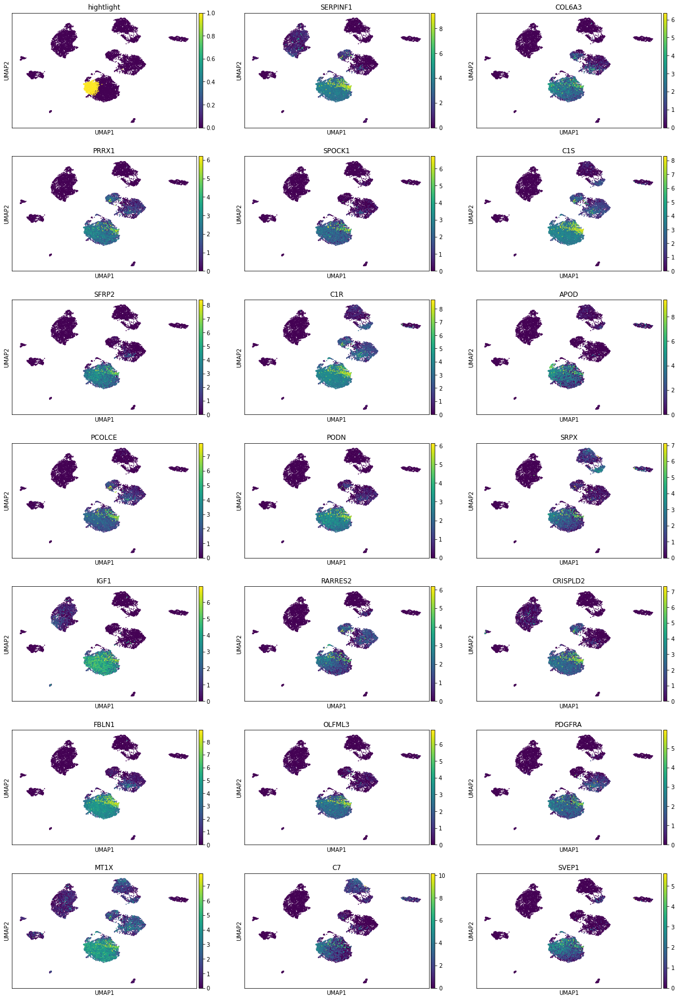

In [24]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


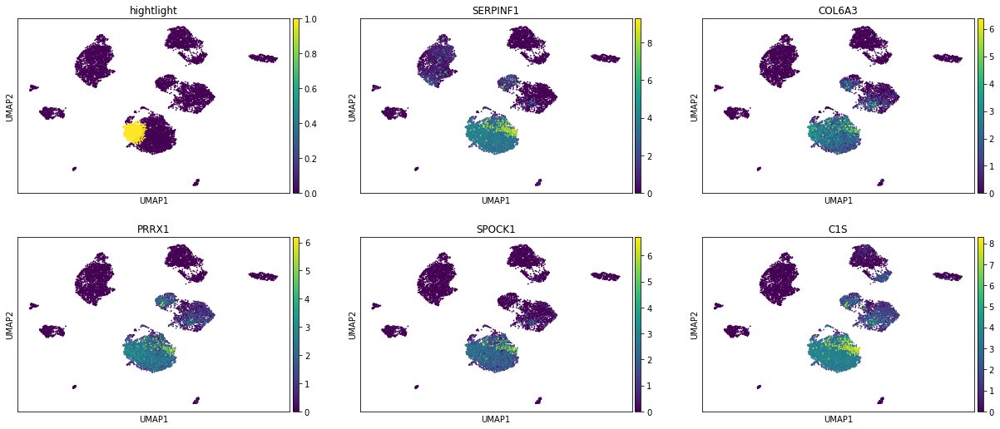

1


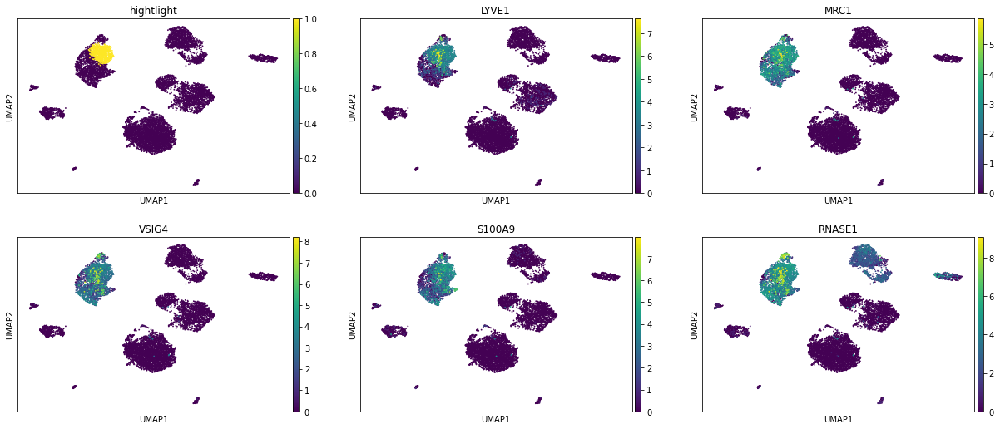

2


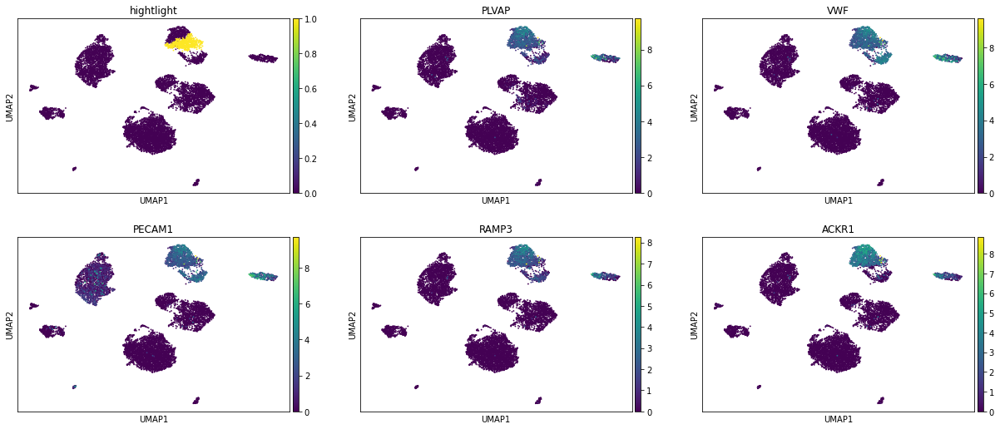

3


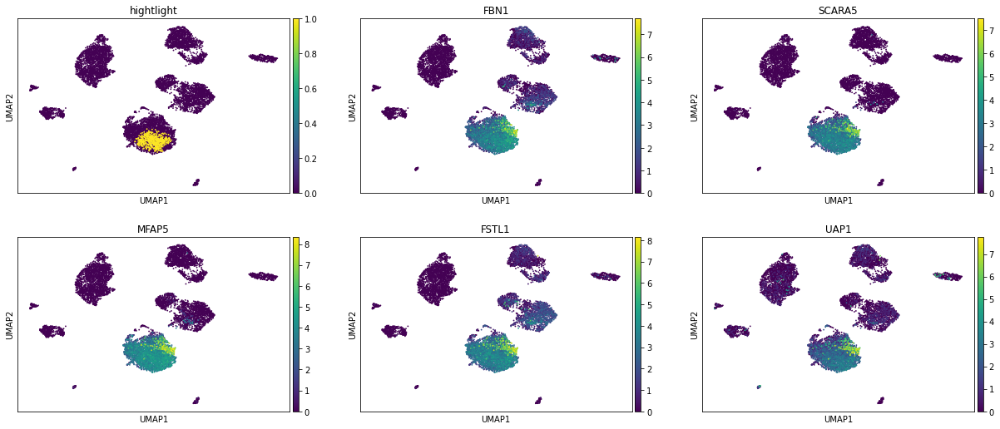

4


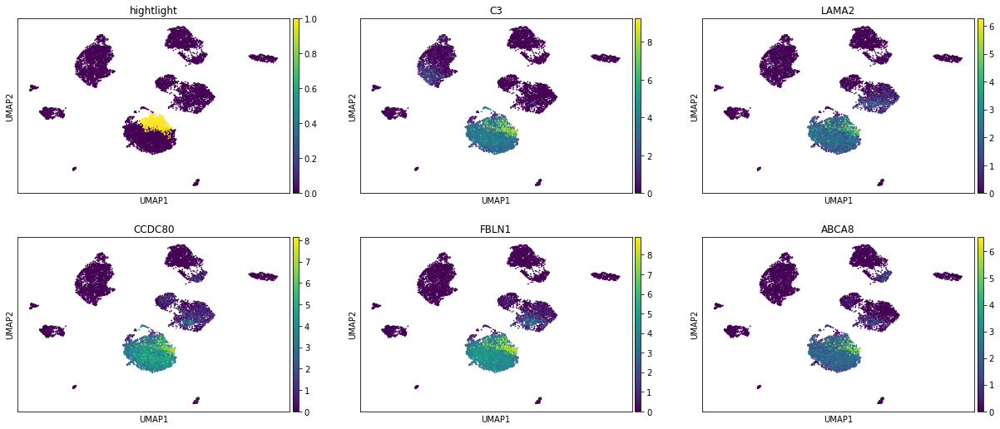

5


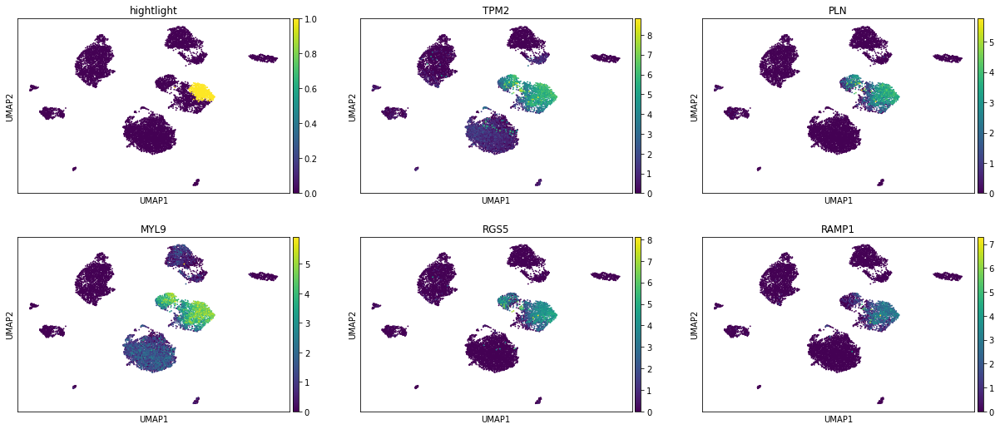

6


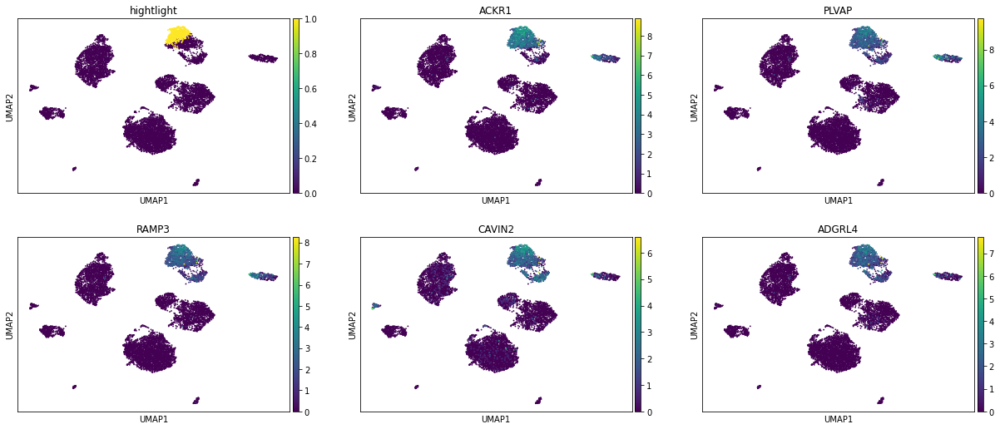

7


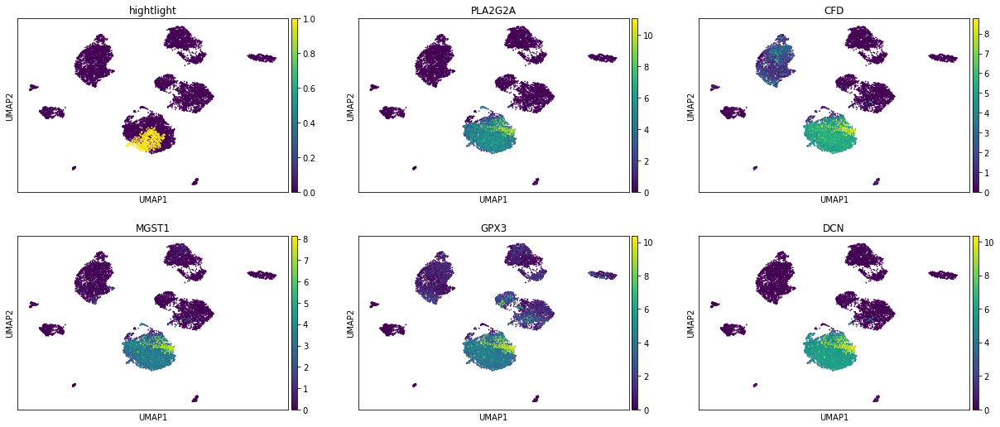

8


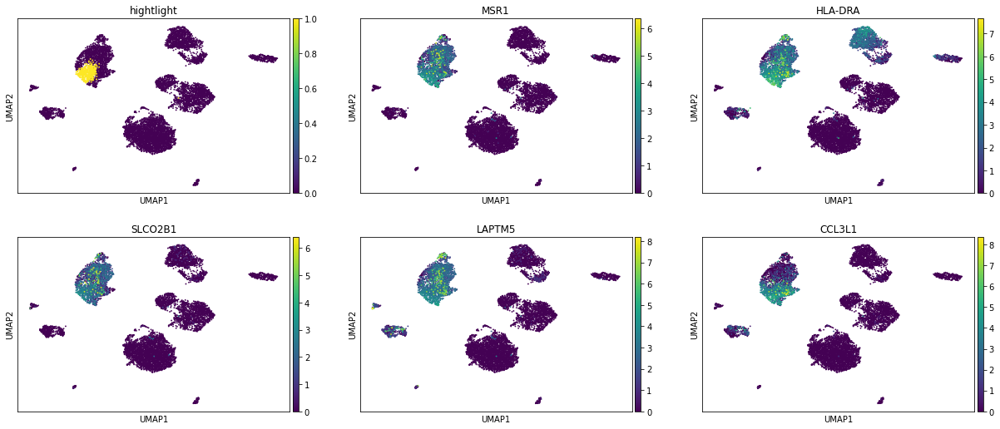

9


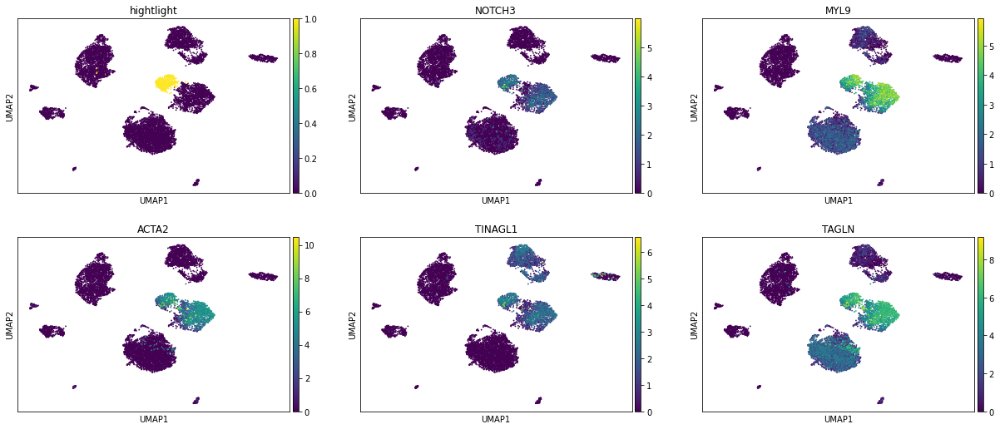

10


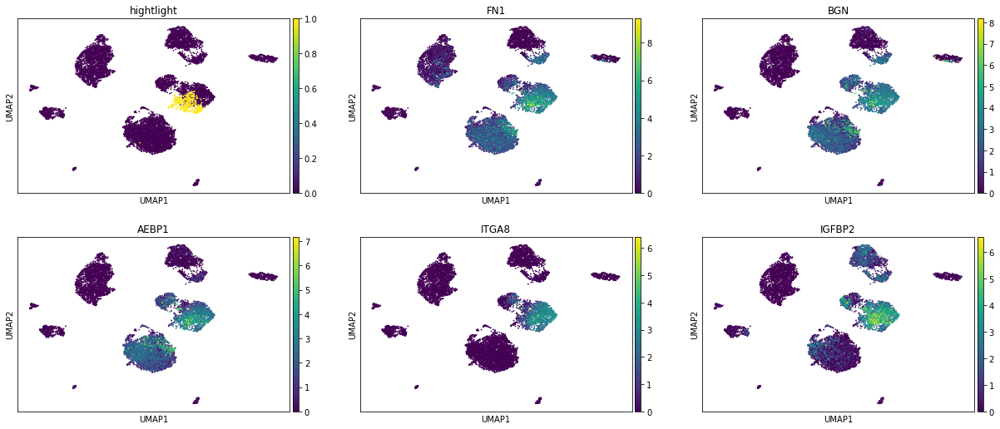

11


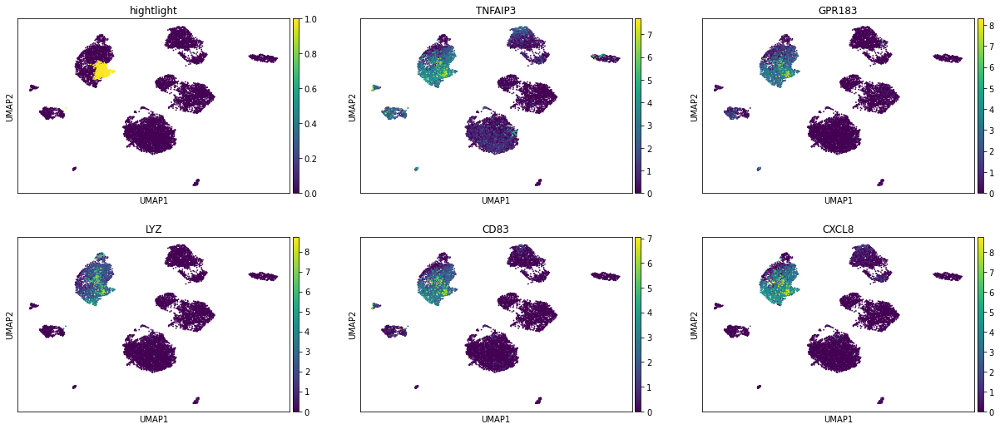

12


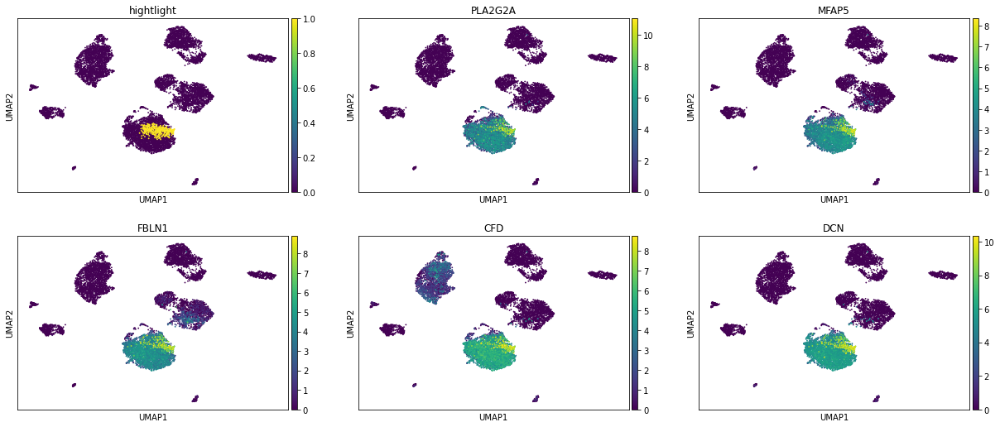

13


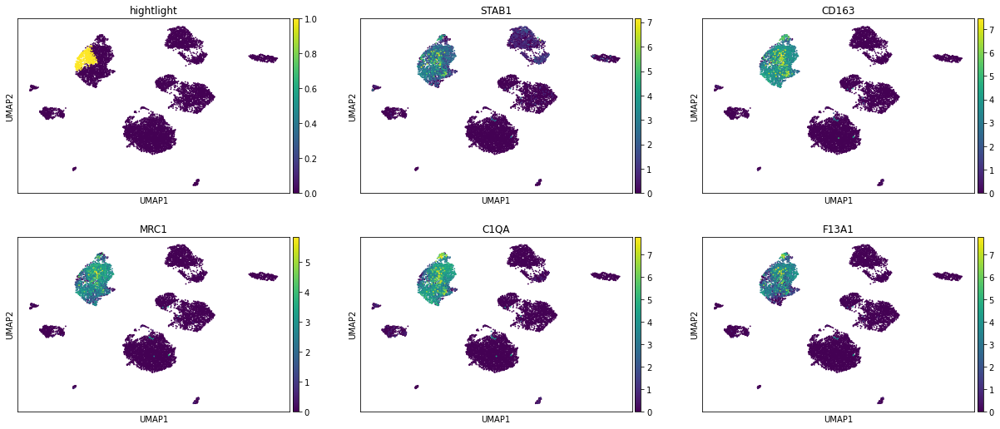

14


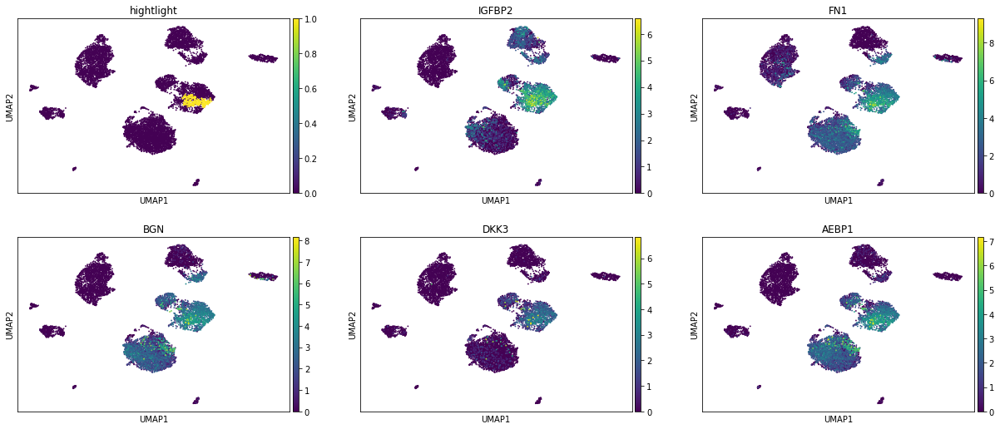

15


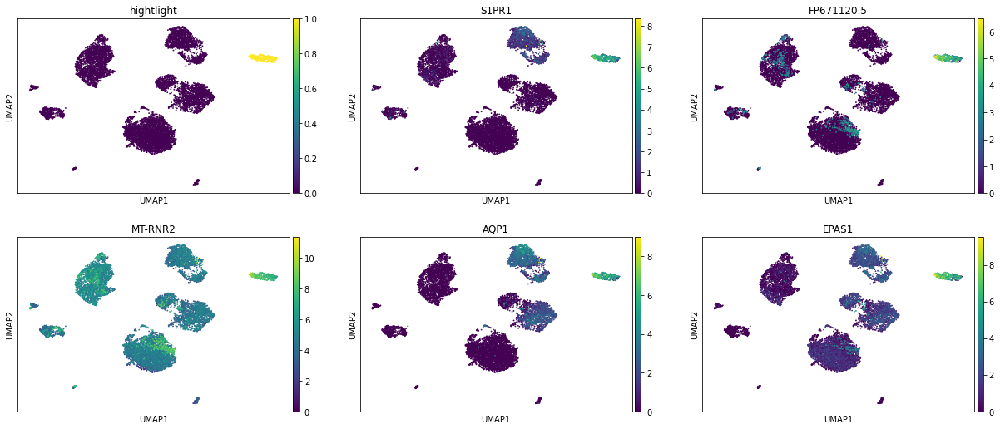

16


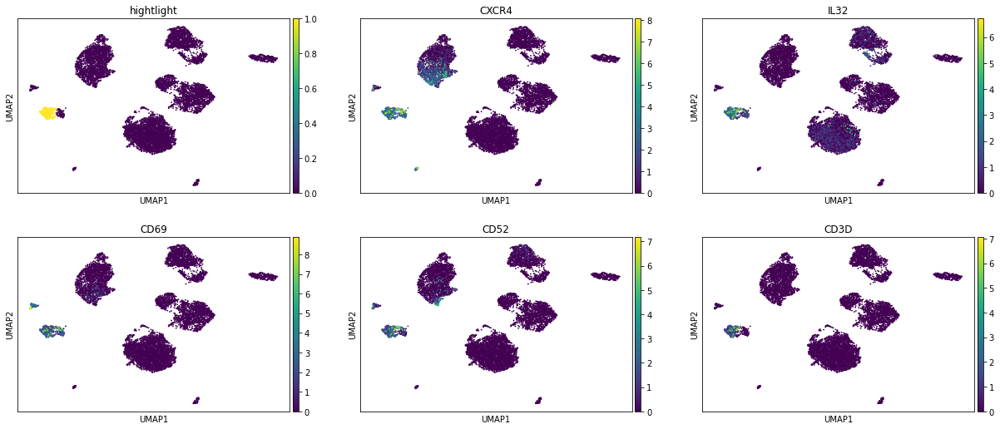

17


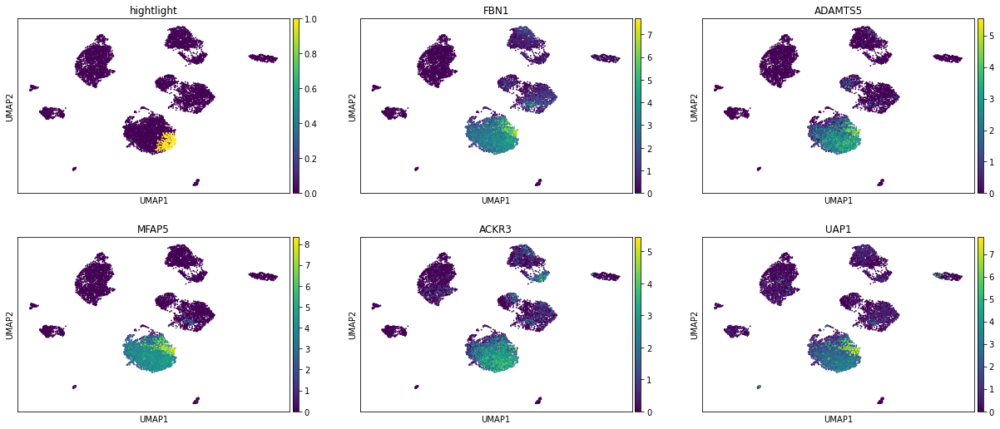

18


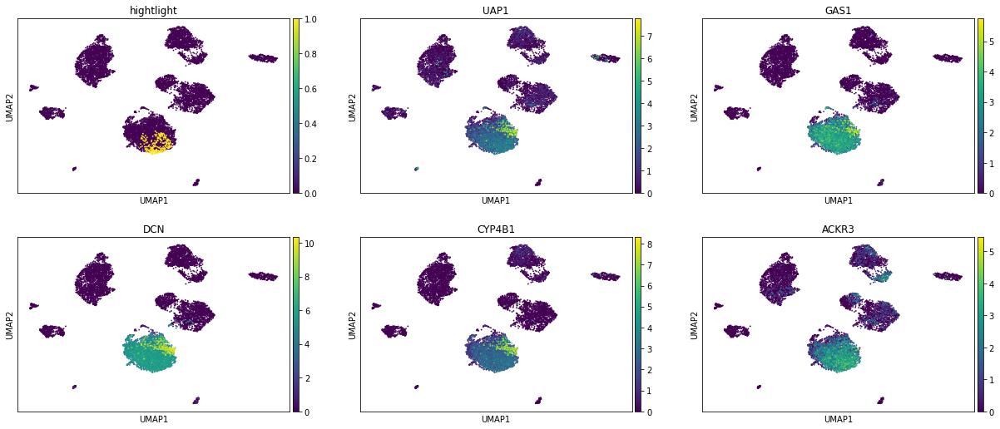

19


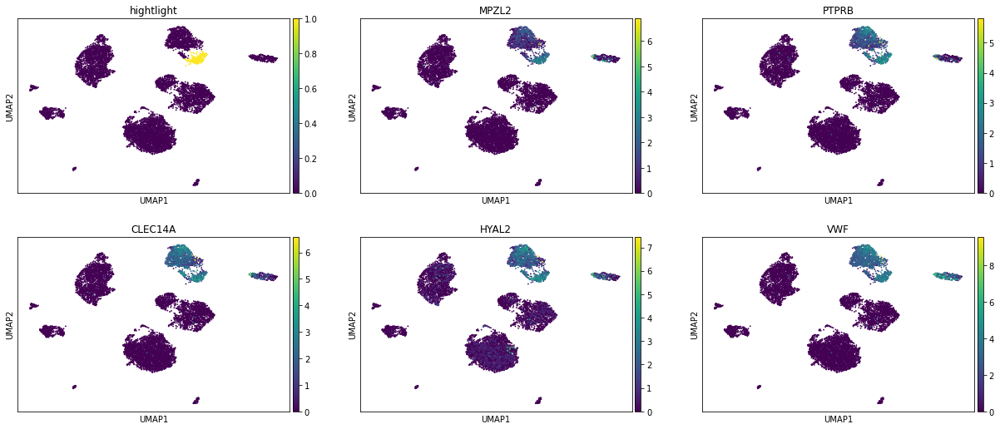

20


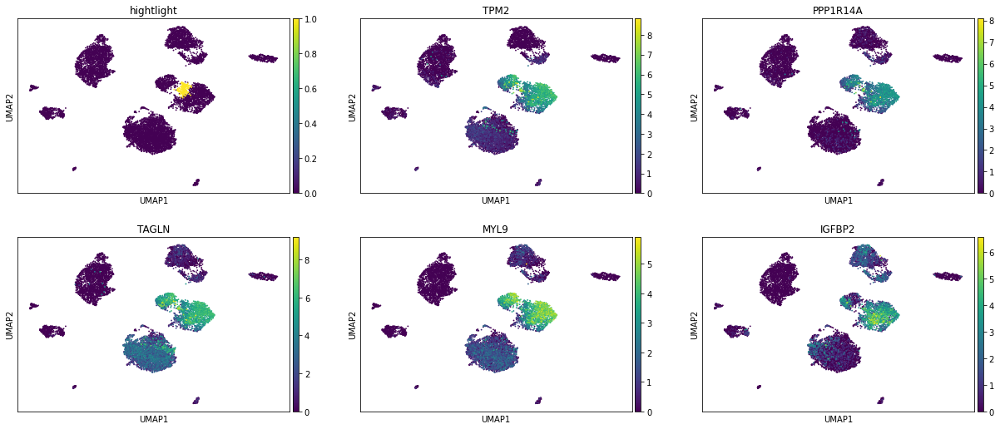

21


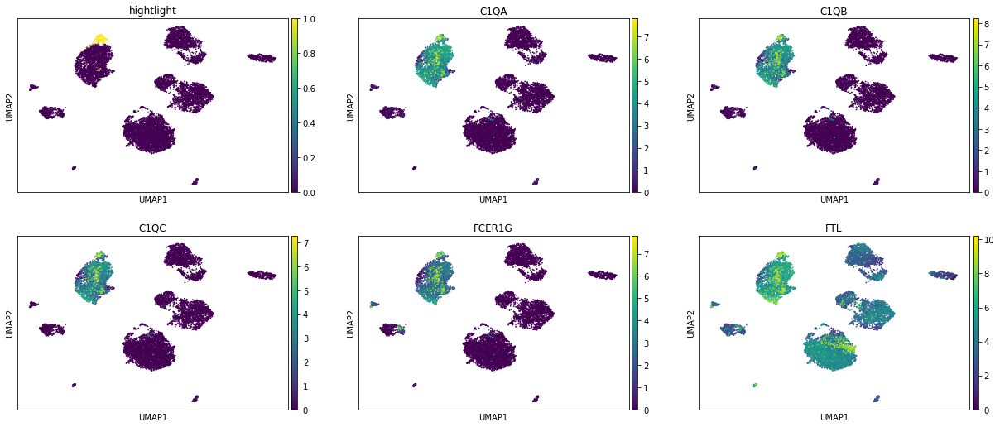

22


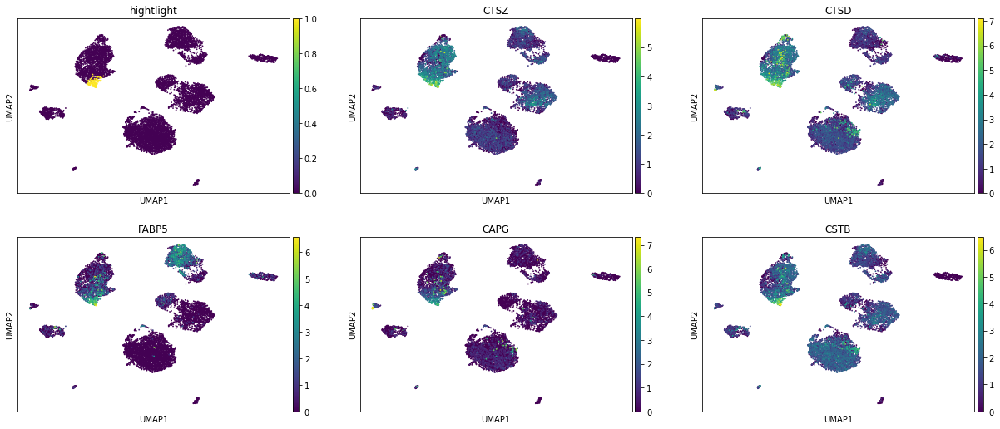

23


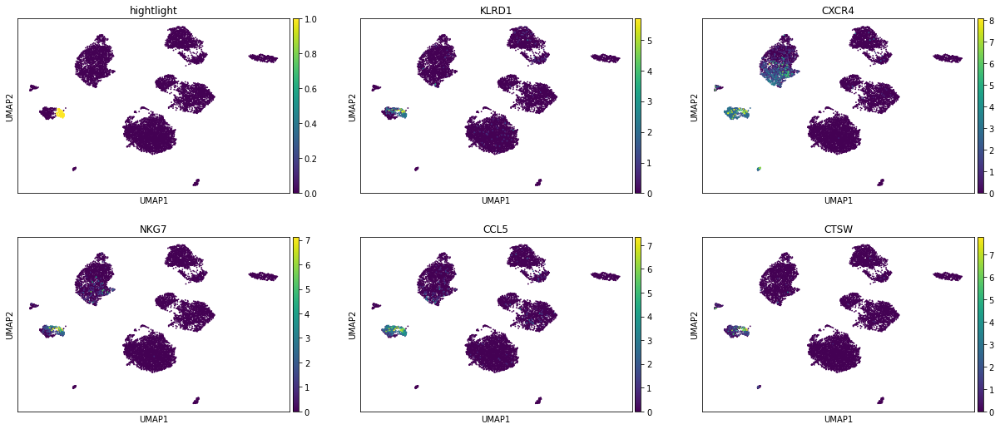

24


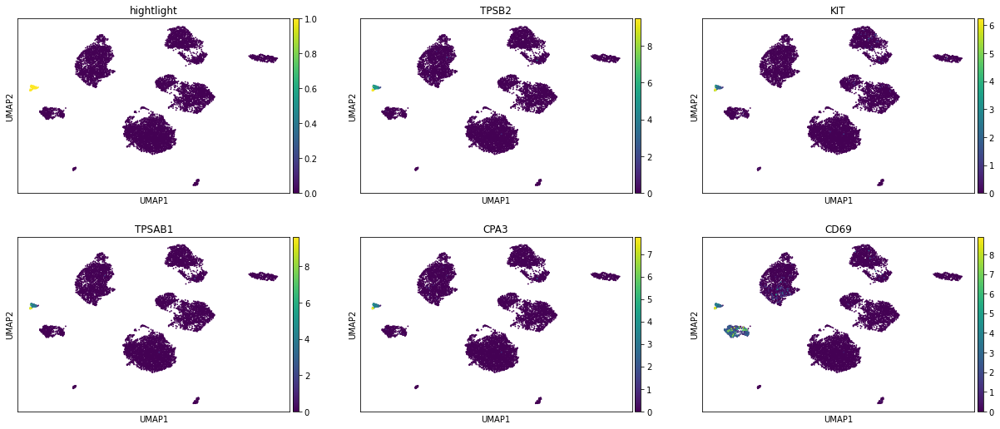

25


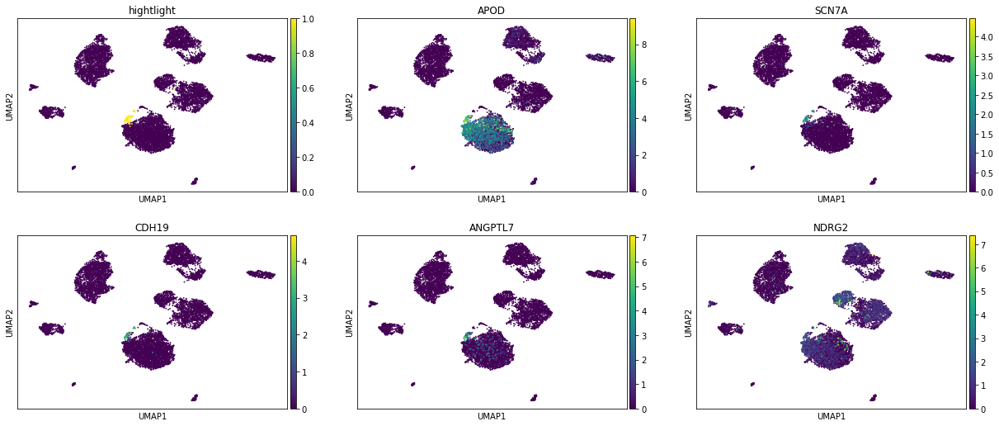

26


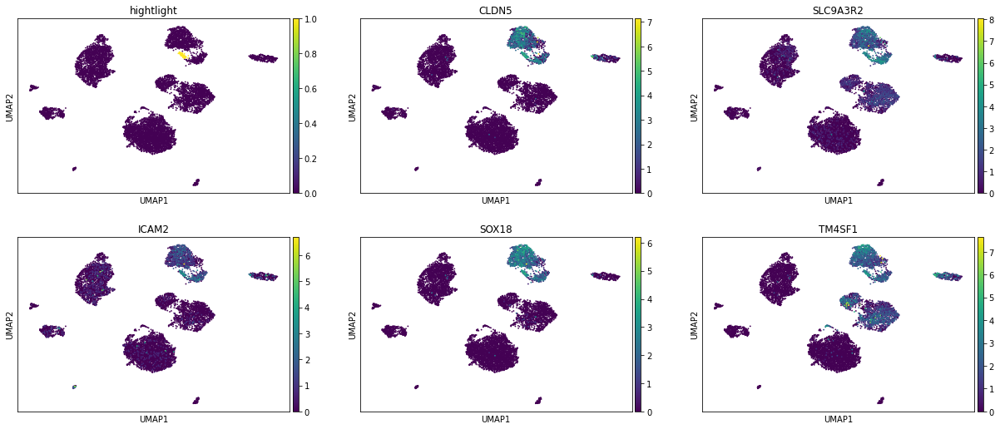

27


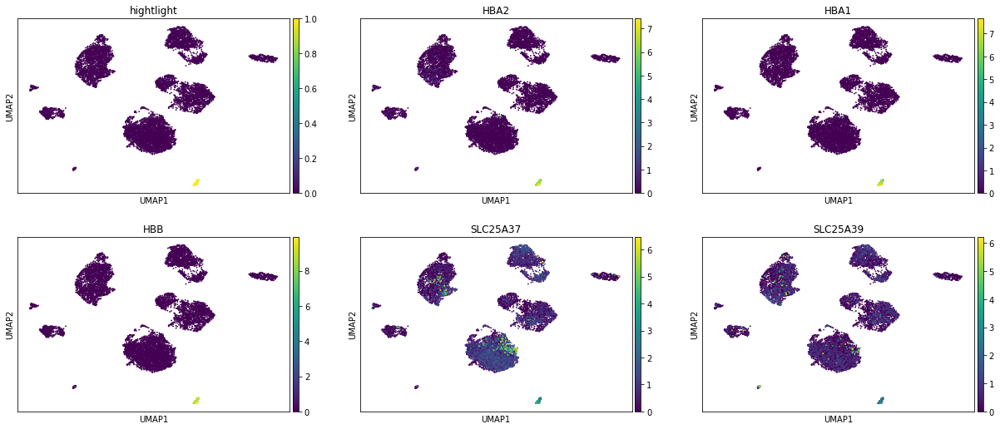

28


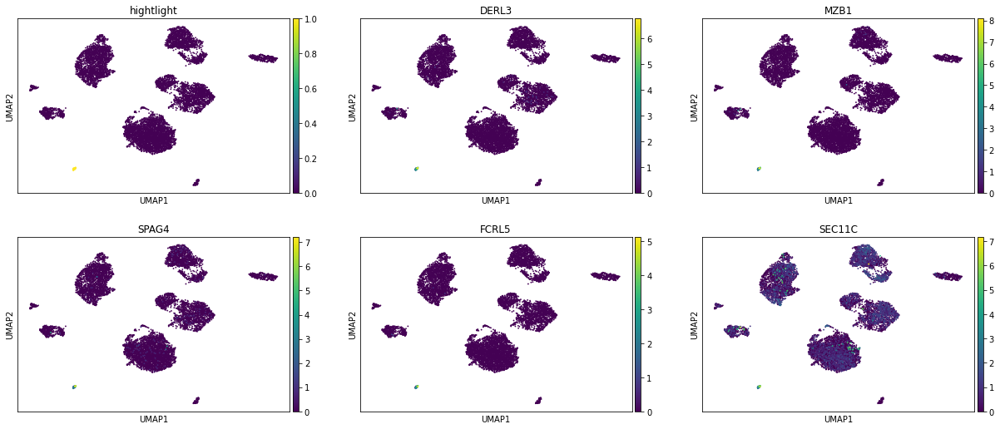

29


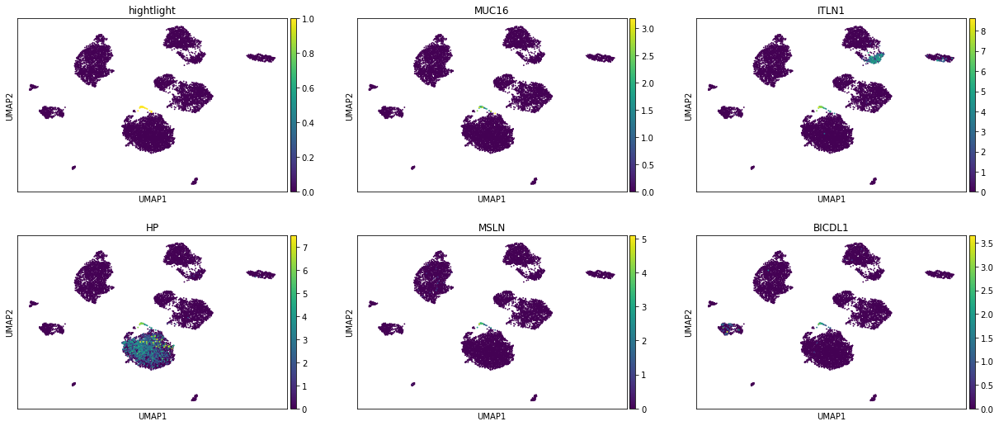

In [25]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [26]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
SERPINF1,34.297207,4.121323,5.084276e-253
COL6A3,32.768597,3.396478,4.857053e-231
PRRX1,32.482800,3.099557,3.660727e-227
SPOCK1,32.251904,3.284850,4.868929e-224
C1S,32.030838,3.430645,4.778911e-221
...,...,...,...
HLA-DRA,-15.940496,-30.511118,3.806568e-55
RNASE1,-17.298948,-31.252619,6.667224e-65
CD74,-18.613110,-7.545005,4.305489e-75
LRRFIP1,-19.669931,-3.067630,7.895935e-84


# read in cell ontology 

In [27]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [28]:
celltype_dict['T cell']

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [29]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'effector memory CD4-positive, alpha-beta T cell',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'activated CD4-positive, alpha-beta T cell, human',
 'CD4-positive type I NK T cell secreting interferon-gamma',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD4-positive, alpha-beta T cell',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'naive thymus-derived CD4-positive, alpha-beta T cell',
 'CD4-positive, alpha-beta thymocyte',
 'activated CD4-positive type I NK T cell',
 'CD4-positive, alpha-beta intraepithelial T cell',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'CD4-intermediate, CD8-positive double-positive thymocyte',
 'effector CD4-positive, alpha-beta T cell',
 'activated CD4-positive, alpha-beta T cell',
 'mat

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [144]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
# cluster_mapping = {"0": "T cell"}
cluster_mapping = leiden_cell_type
# cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [146]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
#     display(DE[l][cluster_markers[l]])

# Visualize the results of the manual annotation

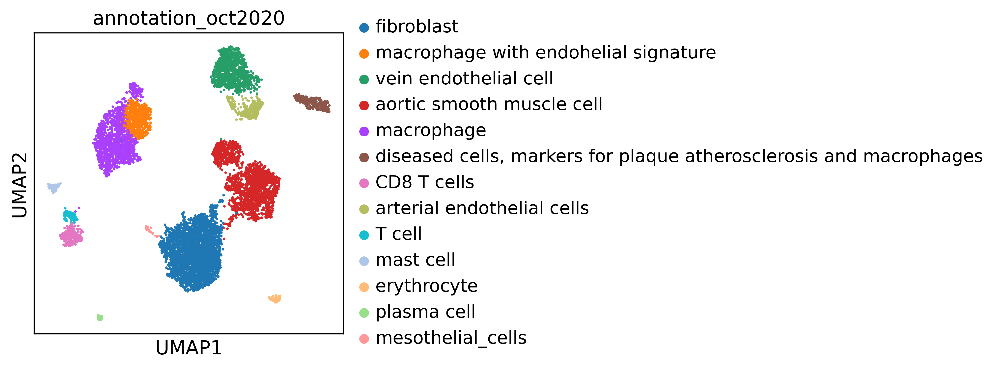

In [147]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# manually create mapping between cell type and compartment (this is just an example)

In [33]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

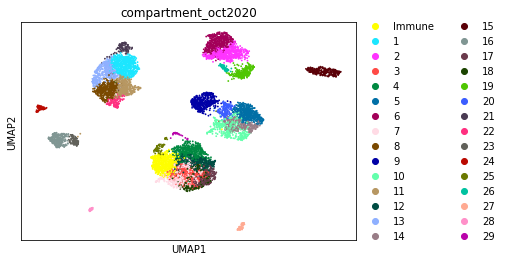

In [35]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [149]:
data_path,organ

('/mnt/ibm_lg/angela/sapiens/data/', 'Vasculature')

In [152]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)